In [16]:
import numpy as np
import math

A = np.array([[54, 50, 49, 55, 53, 70, 81, 102, 94],
     [50, 49, 60, 57, 58, 82, 88, 90, 89],
     [46, 51, 56, 50, 74, 98, 92, 85, 101],
     [55, 54, 50, 58, 96, 113, 102, 101, 108],
     [58, 53, 51, 70, 140, 139, 130, 128, 127],
     [55, 62, 70, 75, 123, 106, 102, 102, 100],
     [57, 65, 64, 74, 91, 80, 84, 87, 90],
     [59, 63, 54, 57, 67, 70, 70, 64, 66],
     [40, 54, 53, 49, 40, 51, 67, 85, 78]])

print("m00 = ",A.sum())
m10 = 0
m01 = 0
for i in range(-4,5):
    m10 += i*A[:,i+4].sum()
    m01 += -i*A[i+4,:].sum()
print("m10 = ", m10)
print("m01 = ", m01)

print("C = ", m10/A.sum(), m01/A.sum())
print("t = ", math.atan(m01/m10)*180/math.pi)


m00 =  6091
m10 =  3427
m01 =  387
C =  0.5626333935314398 0.06353636512887867
t =  6.442931426147625


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import time
from LPM import LPM_filter
# localtime = time.asctime( time.localtime(time.time()) )
# print ("Waktu lokal saat ini :", localtime)

In [2]:
def plot_images(*imgs, figsize=(30,20), hide_ticks=False):
    f = plt.figure(figsize=figsize)
    width = np.ceil(np.sqrt(len(imgs)))
    height = np.ceil(len(imgs) / width)
    for i, img in enumerate(imgs, 1):
        ax = f.add_subplot(int(height), int(width), i)
        if hide_ticks:
            ax.axis('off')
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))



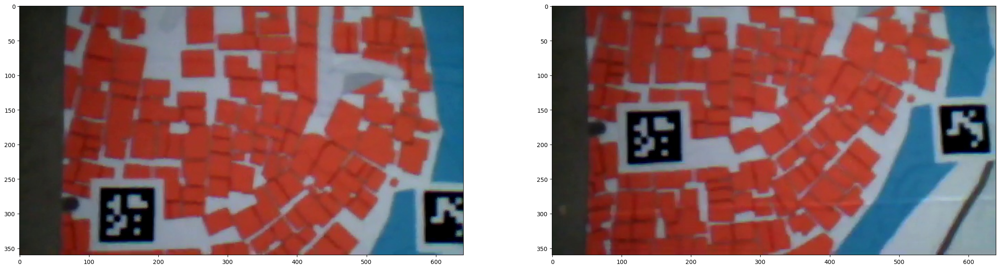

In [33]:
left = cv2.imread('DataPeta/144201.jpg')
right = cv2.imread('DataPeta/144204.jpg')

left_gray = cv2.cvtColor(left, cv2.COLOR_BGR2GRAY)
right_gray = cv2.cvtColor(right, cv2.COLOR_BGR2GRAY)

plot_images(left, right)


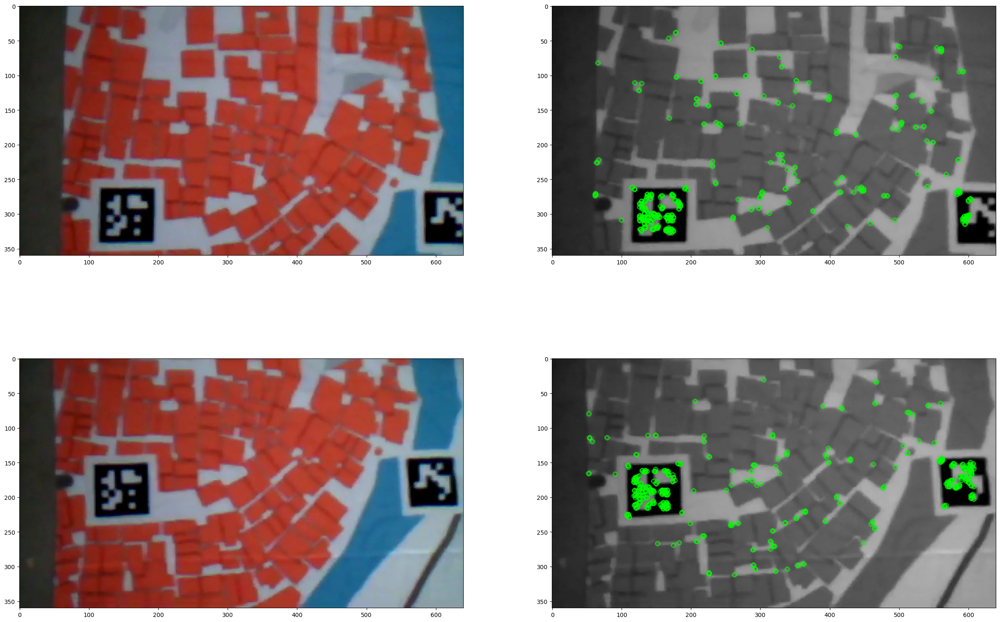

In [34]:
orb = cv2.ORB_create(nfeatures=500, scaleFactor=1.1, nlevels=2, edgeThreshold=31, firstLevel=0, WTA_K=2, patchSize=31, fastThreshold=20)

kp_left, des_left = orb.detectAndCompute(left, None)
kp_right, des_right = orb.detectAndCompute(right, None)

keypoints_drawn_left = cv2.drawKeypoints(left_gray, kp_left, None, color=(0, 255, 0))
keypoints_drawn_right = cv2.drawKeypoints(right_gray, kp_right, None, color=(0, 255, 0))

plot_images(left, keypoints_drawn_left, right, keypoints_drawn_right)

In [35]:
print(kp_left)

(< cv2.KeyPoint 000001C4EE47BE10>, < cv2.KeyPoint 000001C4EE44FC00>, < cv2.KeyPoint 000001C4EE44EC10>, < cv2.KeyPoint 000001C4EB7819E0>, < cv2.KeyPoint 000001C4EB781C80>, < cv2.KeyPoint 000001C4EB781230>, < cv2.KeyPoint 000001C4EB7804E0>, < cv2.KeyPoint 000001C4EB781680>, < cv2.KeyPoint 000001C4EB781860>, < cv2.KeyPoint 000001C4EF83B390>, < cv2.KeyPoint 000001C4EF83B990>, < cv2.KeyPoint 000001C4EF805770>, < cv2.KeyPoint 000001C4EF806430>, < cv2.KeyPoint 000001C4EB81FC30>, < cv2.KeyPoint 000001C4EB81FC00>, < cv2.KeyPoint 000001C4EB81FB10>, < cv2.KeyPoint 000001C4EB81FAE0>, < cv2.KeyPoint 000001C4EB81FA20>, < cv2.KeyPoint 000001C4EB740660>, < cv2.KeyPoint 000001C4EB7411A0>, < cv2.KeyPoint 000001C4EB740990>, < cv2.KeyPoint 000001C4EB7421F0>, < cv2.KeyPoint 000001C4EB742220>, < cv2.KeyPoint 000001C4EB742250>, < cv2.KeyPoint 000001C4EB742280>, < cv2.KeyPoint 000001C4EB740270>, < cv2.KeyPoint 000001C4EB7400F0>, < cv2.KeyPoint 000001C4EB7408A0>, < cv2.KeyPoint 000001C4EB740690>, < cv2.KeyPoin

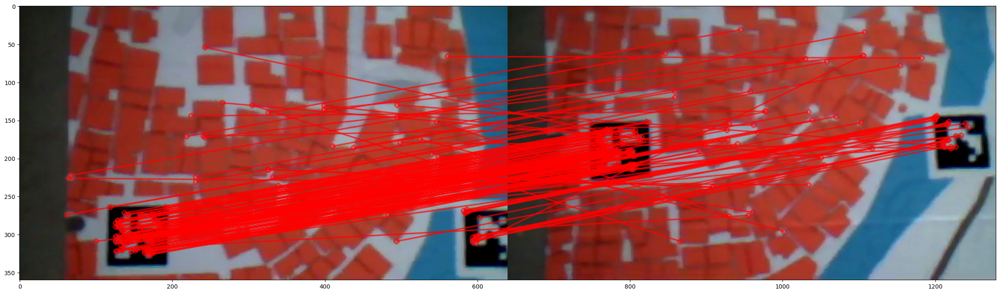

In [36]:
# Brute Force
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des_left,des_right)

matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, matches, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(matches_drawn)

# LPM
# matches = LPM_filter(des_left,des_right)

# matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, matches, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# plot_images(matches_drawn)

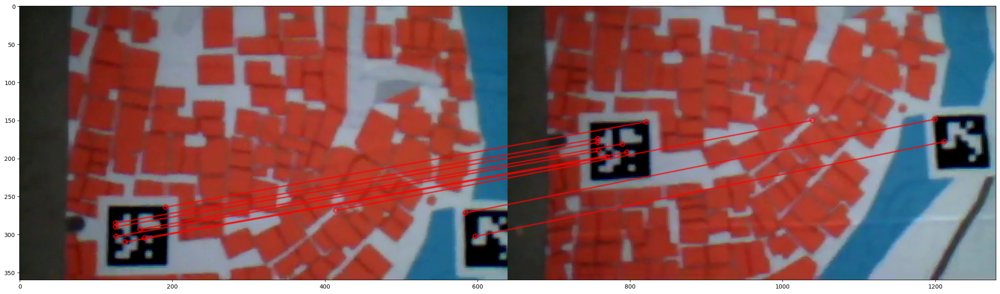

In [37]:
limit = 9
best = sorted(matches, key = lambda x:x.distance)[:limit]

best_matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, best, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(best_matches_drawn)

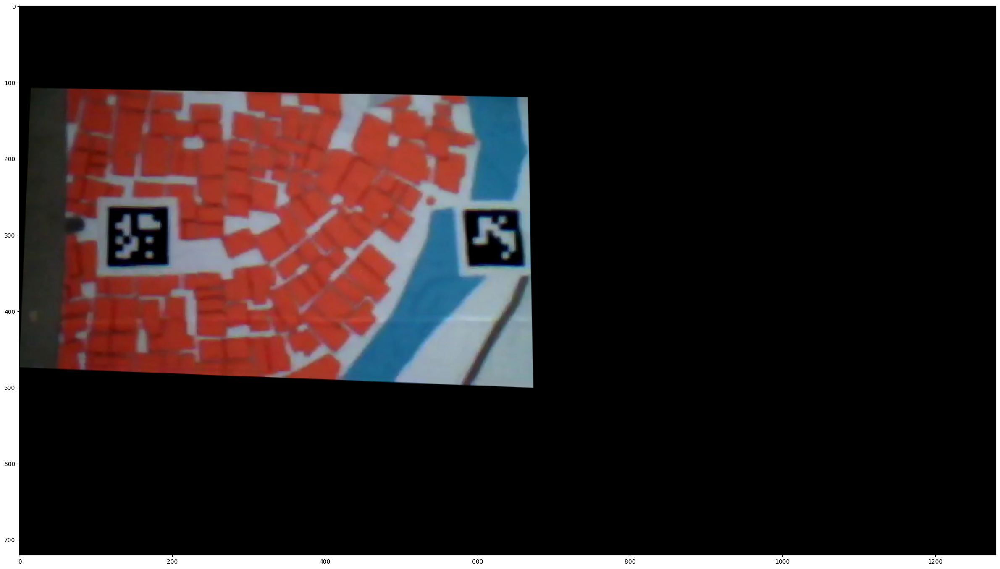

In [38]:
left_pts = []
right_pts = []
for m in best:
    l = kp_left[m.queryIdx].pt
    r = kp_right[m.trainIdx].pt
    left_pts.append(l)
    right_pts.append(r)

M, _ = cv2.findHomography(np.float32(right_pts), np.float32(left_pts),cv2.RANSAC,50.0)

dim_x = left.shape[1] + right.shape[1]
dim_y = left.shape[0] + right.shape[0]
dim = (dim_x, dim_y)

warped = cv2.warpPerspective(right, M, dim)
plot_images(warped)


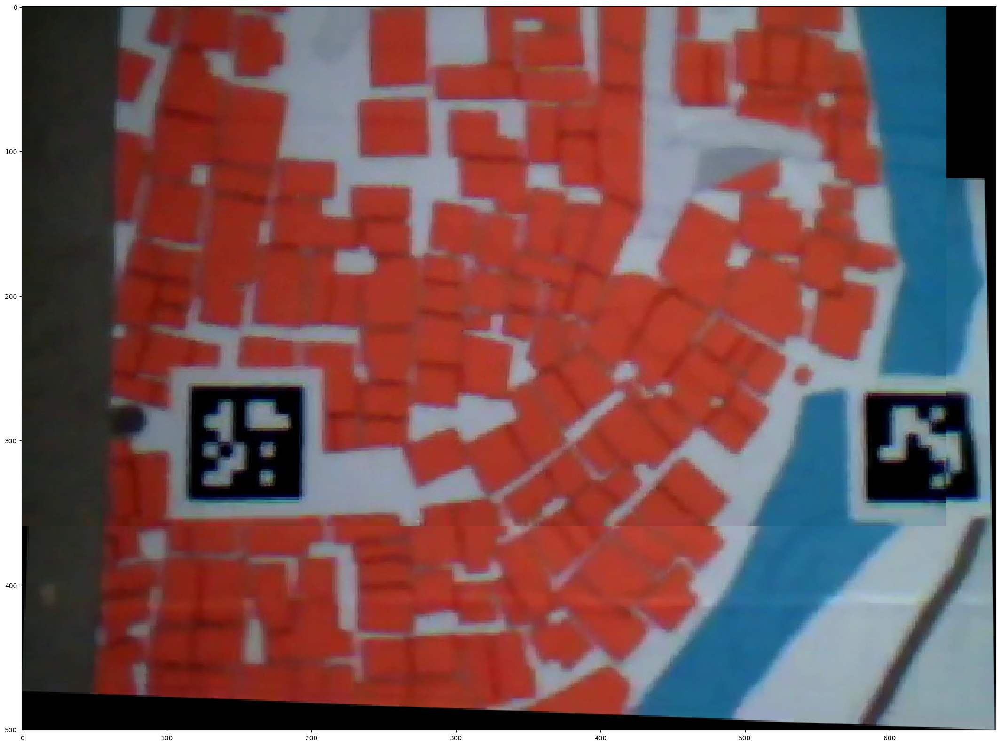

In [39]:
comb = warped.copy()
# combine the two images
comb[0:left.shape[0],0:left.shape[1]] = left

comb_gray = cv2.cvtColor(comb, cv2.COLOR_BGR2GRAY)
# for k in range(left_gray.shape[1]):
#     for l in range(left_gray.shape[0]):
#         if comb_gray[l,k] <= left_gray[l,k]:
#             comb[l,k] = left[l,k]
        
        
# plot_images(comb)

# crop
for i in range(int(dim_x/2),dim_x):
    if comb_gray[:,i].sum() == 0:
        x_crop = i
        break
for i in range(int(dim_y/3),dim_y):
    if comb_gray[i,:].sum() == 0:
        y_crop = i
        break      
# print(x_crop," ",y_crop)
pref = comb[:y_crop, :x_crop]
# comb = cv2.resize(comb,(0,0),fx=0.5,fy=0.5)

plot_images(pref)
# cv2.imwrite("comb_drone.jpg",comb)

In [40]:
localtime = time.asctime( time.localtime(time.time()) )
print ("Waktu lokal saat ini :", localtime)

Waktu lokal saat ini : Thu Mar 14 12:24:05 2024


error: OpenCV(4.8.1) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


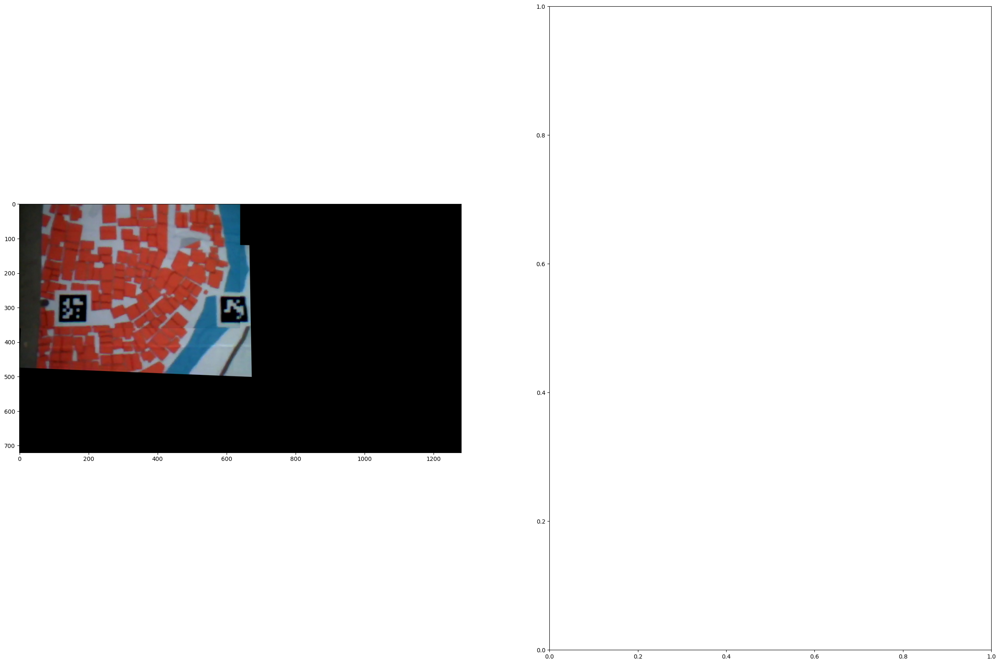

In [41]:
left = comb
right = cv2.imread('dummy\Layer 5.png')

plot_images(left, right)

In [ ]:
orb = cv2.ORB_create()

kp_left, des_left = orb.detectAndCompute(left, None)
kp_right, des_right = orb.detectAndCompute(right, None)

keypoints_drawn_left = cv2.drawKeypoints(left, kp_left, None, color=(0, 0, 255))
keypoints_drawn_right = cv2.drawKeypoints(right, kp_right, None, color=(0, 0, 255))

plot_images(left, keypoints_drawn_left, right, keypoints_drawn_right)

error: OpenCV(4.8.1) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


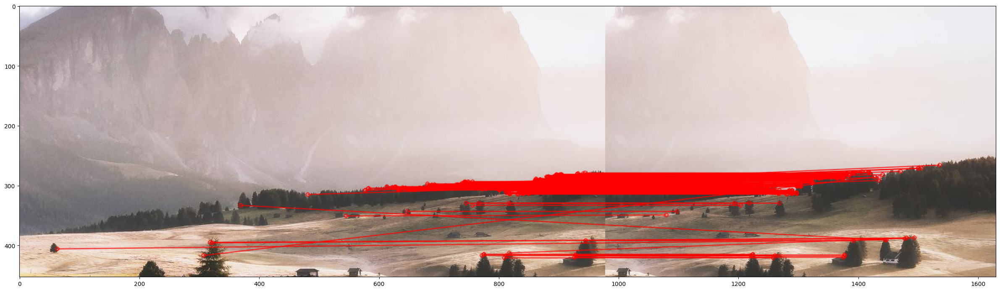

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des_left,des_right)

matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, matches, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(matches_drawn)

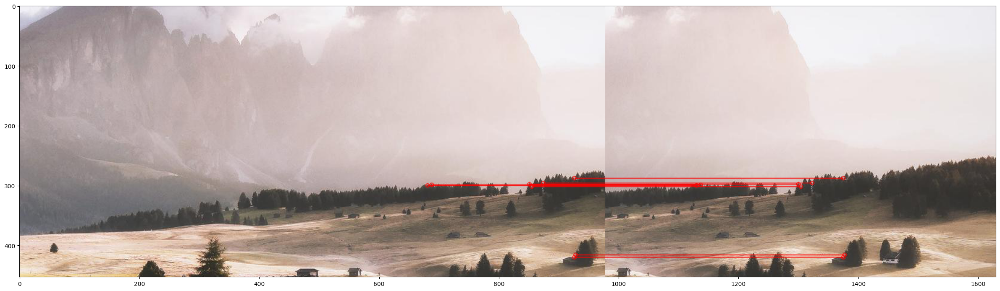

In [ ]:
limit = 8
best = sorted(matches, key = lambda x:x.distance)[:limit]

best_matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, best, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(best_matches_drawn)

#LPM


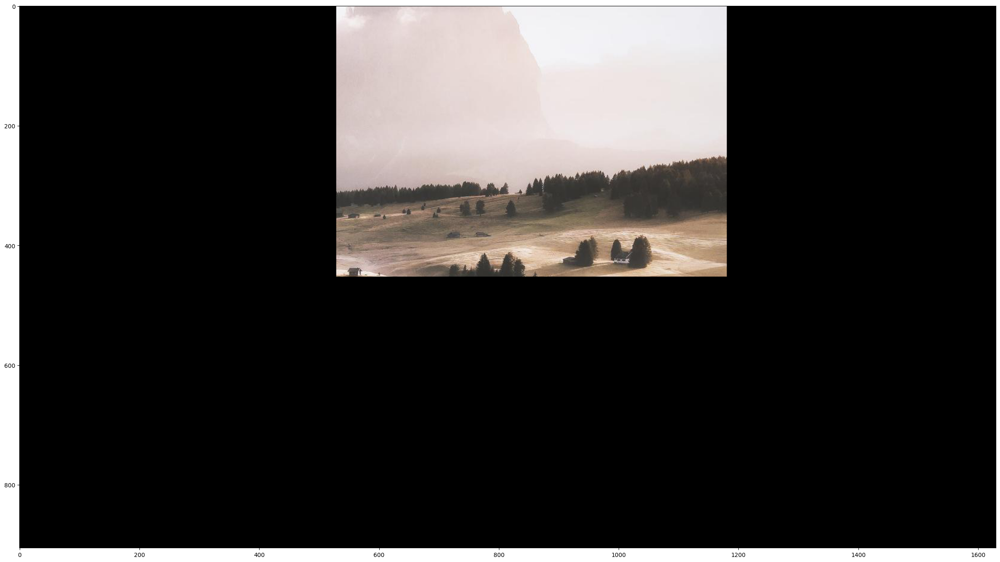

In [ ]:
left_pts = []
right_pts = []
for m in best:
    l = kp_left[m.queryIdx].pt
    r = kp_right[m.trainIdx].pt
    left_pts.append(l)
    right_pts.append(r)

M, _ = cv2.findHomography(np.float32(right_pts), np.float32(left_pts))

dim_x = left.shape[1] + right.shape[1]
dim_y = left.shape[0] + right.shape[0]
dim = (dim_x, dim_y)

warped = cv2.warpPerspective(right, M, dim)

plot_images(warped)

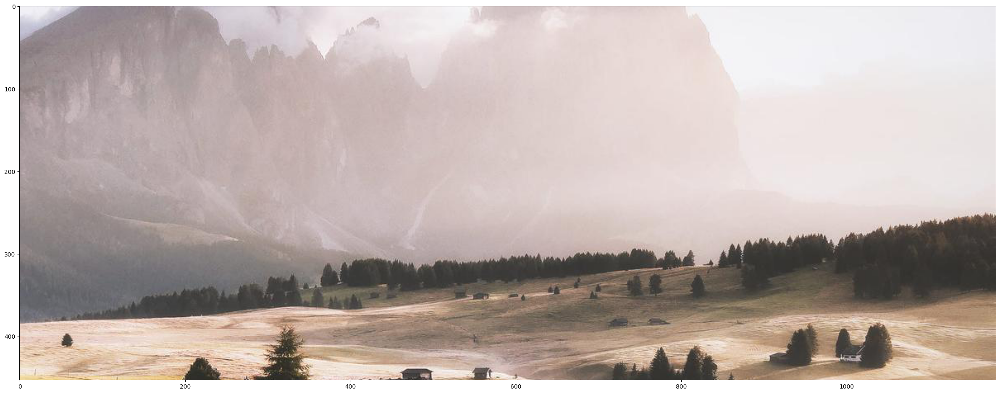

In [ ]:
comb = warped.copy()
# combine the two images
for i in range(left.shape[1]):
    for j in range(left.shape[0]):
        if left[j,i].all() != 0:
            comb[j,i] = left[j,i]
plot_images(comb)
# crop
comb_gray = cv2.cvtColor(comb, cv2.COLOR_BGR2GRAY)
for i in range(dim_x):
    if comb_gray[:,i].sum() == 0:
        x_crop = i
        break
for i in range(dim_y):
    if comb_gray[i,:].sum() == 0:
        y_crop = i
        break      

comb = comb[:y_crop, :x_crop]
# comb = cv2.resize(comb,(0,0),fx=0.5,fy=0.5)

plot_images(comb)
# cv2.imwrite("comb_drone.jpg",comb)